# Imports

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
from statsmodels.tsa.deterministic import DeterministicProcess, CalendarFourier, Fourier

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler

plt.rcParams['figure.figsize'] = (20, 10)
#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

In [2]:
flu_id = pd.read_csv("VIW_FID_EPI.csv")
flu_net = pd.read_csv("VIW_FNT.csv")
flu_dict = pd.read_csv("VIW_FLU_METADATA.csv")

C:\Users\christopher.johnson\AppData\Local\Temp\ipykernel_12400\111155050.py:1: DtypeWarning: Columns (31,36) have mixed types. Specify dtype option on import or set low_memory=False.
  flu_id = pd.read_csv("VIW_FID_EPI.csv")


In [10]:
print(flu_id.head())

  WHOREGION FLUSEASON HEMISPHERE          ITZ COUNTRY_CODE  \
0       AFR        SH         NH  FLU_MID_AFR          SSD   
1       AFR        SH         NH  FLU_MID_AFR          SSD   
2       AFR        SH         NH  FLU_MID_AFR          SSD   
3       AFR        SH         NH  FLU_MID_AFR          SSD   
4       AFR        SH         NH  FLU_MID_AFR          SSD   

  COUNTRY_AREA_TERRITORY ISO_WEEKSTARTDATE  ISO_YEAR  ISO_WEEK  \
0            South Sudan        2019-03-25      2019        13   
1            South Sudan        2019-04-08      2019        15   
2            South Sudan        2019-04-15      2019        16   
3            South Sudan        2019-04-29      2019        18   
4            South Sudan        2019-05-13      2019        20   

  MMWR_WEEKSTARTDATE  MMWR_YEAR  MMWR_WEEK ORIGIN_SOURCE AGEGROUP_CODE  \
0         2019-03-24       2019         13    NOTDEFINED           All   
1         2019-04-07       2019         15    NOTDEFINED        15TO49   
2       

In [12]:
flu_dict

,DatasetName,TableName,FieldName,DataType,Description,Comments
0,FluNet,VIW_FNT,WHOREGION,string,"WHO regions (AFR, AMR, EMR, EUR, SEAR, WPR)",see: https://www.who.int/about/structure
1,FluNet,VIW_FNT,FLUSEASON,string,"Reporting season (NH=northern hemisphere, SH=s...",NaN
2,FluNet,VIW_FNT,HEMISPHERE,string,"Hemisphere (NH=northern hemisphere, SH=souther...",NaN
3,FluNet,VIW_FNT,ITZ,string,Influenza transmission zone,see: https://cdn.who.int/media/docs/default-so...
4,FluNet,VIW_FNT,COUNTRY_CODE,string,ISO3 country codes,includes WHO defined codes if not ISO3 code av...
5,FluNet,VIW_FNT,COUNTRY_AREA_TERRITORY,string,"Country, area or territory name",NaN
6,FluNet,VIW_FNT,ISO2,string,ISO2 country code,includes WHO defined codes if not ISO3 code av...
7,FluNet,VIW_FNT,ISO_WEEKSTARTDATE,date,Week start date (ISO 8601),NaN
8,FluNet,VIW_FNT,ISO_YEAR,integer,Year (ISO 8601),NaN
9,FluNet,VIW_FNT,ISO_WEEK,integer,Week (ISO 8601),NaN


# Dictionary

## FLU_NET

In [13]:
flu_net_dict = flu_dict[flu_dict.TableName == "VIW_FNT"].drop(["DatasetName","TableName"],axis=1)

In [14]:
flu_net_dict

,FieldName,DataType,Description,Comments
0,WHOREGION,string,"WHO regions (AFR, AMR, EMR, EUR, SEAR, WPR)",see: https://www.who.int/about/structure
1,FLUSEASON,string,"Reporting season (NH=northern hemisphere, SH=s...",NaN
2,HEMISPHERE,string,"Hemisphere (NH=northern hemisphere, SH=souther...",NaN
3,ITZ,string,Influenza transmission zone,see: https://cdn.who.int/media/docs/default-so...
4,COUNTRY_CODE,string,ISO3 country codes,includes WHO defined codes if not ISO3 code av...
5,COUNTRY_AREA_TERRITORY,string,"Country, area or territory name",NaN
6,ISO2,string,ISO2 country code,includes WHO defined codes if not ISO3 code av...
7,ISO_WEEKSTARTDATE,date,Week start date (ISO 8601),NaN
8,ISO_YEAR,integer,Year (ISO 8601),NaN
9,ISO_WEEK,integer,Week (ISO 8601),NaN


In [15]:
flu_net_dict[flu_net_dict.FieldName == "FLUSEASON"]["Description"].iloc[0]

'Reporting season (NH=northern hemisphere, SH=southern hemisphere, YR=year-round reporting)'

In [16]:
flu_net_dict[flu_net_dict.FieldName == "ORIGIN_SOURCE"]["Description"].iloc[0]

'Surveillance site type (NONSENTINEL/SENTINEL/NOTDEFINED)'

In [17]:
flu_net_dict[flu_net_dict.FieldName == "HEMISPHERE"]["Description"].iloc[0]

'Hemisphere (NH=northern hemisphere, SH=southern hemisphere)'

# FLU_NET

In [18]:
itz_vals = list(flu_net["ITZ"].value_counts().index)
itz_counts = list(flu_net["ITZ"].value_counts())

Text(0.5, 1.0, 'ITZ')

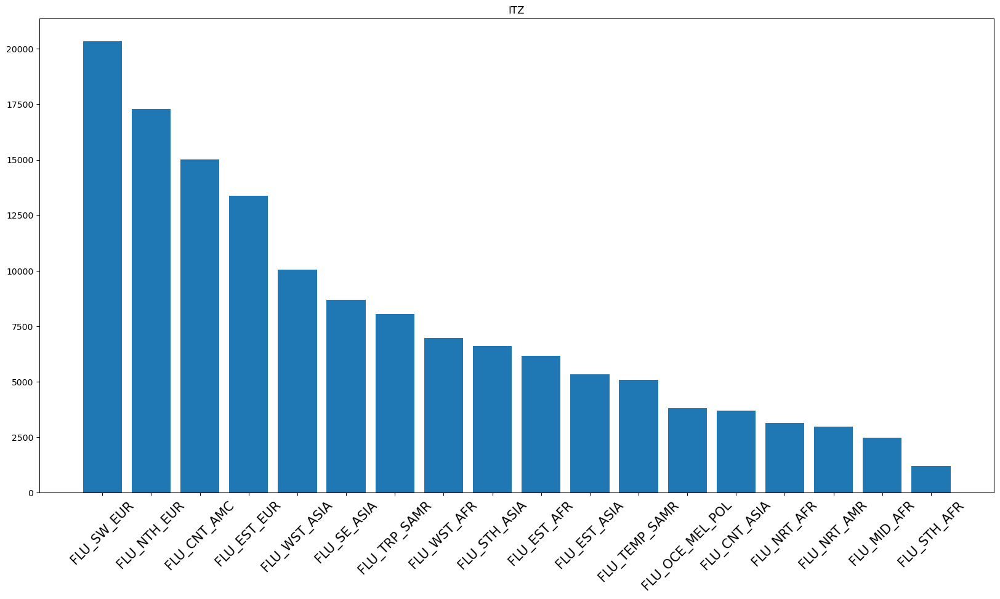

In [19]:
plt.bar(itz_vals,itz_counts)
plt.xticks(rotation=45,size=15)
plt.title("ITZ")


In [20]:
flu_net["COUNTRY_CODE"].value_counts()

RUS    1863
ESP    1775
NOR    1643
SVN    1617
USA    1615
DEU    1614
DNK    1600
POL    1577
COL    1565
FIN    1525
PRT    1495
SWE    1486
CHL    1481
ROU    1465
ISL    1419
CHE    1397
MYS    1395
SVK    1392
MEX    1378
SEN    1372
BRA    1365
AUS    1353
NLD    1352
JPN    1343
ARG    1338
IRL    1328
BEL    1319
X09    1301
LVA    1287
BGR    1279
HKG    1253
UKR    1237
PER    1233
X11    1210
PRY    1184
GRC    1180
GEO    1174
EST    1173
X12    1165
CAN    1161
ZAF    1160
KAZ    1155
MDA    1152
MDG    1151
LTU    1150
KGZ    1128
THA    1122
BLR    1112
PHL    1098
AZE    1085
NCL    1076
URY    1065
IND    1043
EGY    1041
HRV    1018
X10    1016
ITA    1001
HND    1000
CZE     983
TUR     981
SRB     973
ARM     973
ISR     968
LUX     966
GUF     963
CRI     962
AUT     958
MNG     930
DOM     927
SLV     914
KOR     908
CUB     906
IRN     898
PAN     886
ECU     884
VNM     882
BOL     870
JAM     867
SGP     867
GTM     862
KHM     862
LKA     857
CHN     831
HUN 

In [21]:
flu_net_dict[flu_net_dict.FieldName == "INF_A"]["Comments"].iloc[0]

'Number of specimens in which influenza virus antigen was detected with any kind of method; to be reported for year and week when the sample was taken.'

## defs

In [22]:
def pd_to_weektime(df):
    
    indices_ = list(df.index)
    indices_.sort()
    df = df.loc[indices_]

    indices_new = []
    for i in range(len(indices_)):
        d =  str(indices_[i])[:4]+"-"+str(indices_[i])[4:]
       # d= datetime.datetime.strptime(d + '-1', "%Y-%W-%w")
        indices_new.append(d)
    indices_new
    df.index = indices_new
    return df

In [23]:
def create_all_fourier(period):
    fourier = []
    for j in range(int(np.floor(period/2))):
        fourier.append(Fourier(period,j))
    return fourier

In [24]:
class BoostedHybrid:
    def __init__(self,model1,model2):
        self.model1= model1
        self.model2= model2
        self.y_columns = None

    def fit(self,X_1,X_2,y):
        self.model1.fit(X_1,y)
        y_fit=pd.DataFrame(self.model1.predict(X_1),index=X_1.index,columns=y.columns)
        y_resid = y-y_fit
        y_resid = y_resid.stack().squeeze()
        
        self.model2.fit(X_2,y_resid)

        self.y_columns=y.columns
        self.y_fit = y_fit
        self.y_resid = y_resid
    def predict(self,X_1,X_2):
        y_pred = pd.DataFrame(self.model1.predict(X_1),index=X_1.index,columns=self.y_columns)
        y_pred = y_pred.stack().squeeze()
        y_pred +=self.model2.predict(X_2)
        return y_pred.unstack()

In [25]:
def create_lags(df,col,num_lags,start,space):
    df_new = df.copy()
    for i in range(num_lags):
        new_col = col+"_lag_"+str(start+i*space)
        df_new[new_col] = df_new[col].shift(start + i*space).fillna(0.0)
    return df_new.drop([col],axis=1)

In [26]:
def plot_year_lags(main_df,compare_df,col,title):
    
    X_lags = create_lags(compare_df,col,51,1,1)
    ind_start = list(compare_df.index).index(dates[0])
    ind_end = list(compare_df.index).index(dates[-1])
    X_lags = X_lags[ind_start:ind_end]
    new_df = main_df.join(X_lags, on=main_df.index)
    plt.plot(abs(new_df.corr()[col].drop([col])))
    plt.xticks(ticks = list(np.arange(1,51)), rotation=90)
    plt.title(title)
    plt.show()

In [27]:
# prep arb data set
def prep_country(country_code,col):


    tmp_df  = flu_net[flu_net.COUNTRY_CODE==country_code][["MMWRYW",col]].groupby("MMWRYW").sum()
    if tmp_df.empty:
        print("Country code or column wrong, this is an empty dataframe")
    tmp_df = pd_to_weektime(tmp_df)
    return tmp_df

## USA all influenza

In [28]:
flu_net[flu_net.COUNTRY_CODE =="USA"]

,WHOREGION,FLUSEASON,HEMISPHERE,ITZ,COUNTRY_CODE,COUNTRY_AREA_TERRITORY,ISO_WEEKSTARTDATE,ISO_YEAR,ISO_WEEK,MMWR_WEEKSTARTDATE,MMWR_YEAR,MMWR_WEEK,ORIGIN_SOURCE,SPEC_PROCESSED_NB,SPEC_RECEIVED_NB,AH1N12009,AH1,AH3,AH5,AH7N9,ANOTSUBTYPED,ANOTSUBTYPABLE,AOTHER_SUBTYPE,AOTHER_SUBTYPE_DETAILS,INF_A,BVIC_2DEL,BVIC_3DEL,BVIC_NODEL,BVIC_DELUNK,BYAM,BNOTDETERMINED,INF_B,INF_ALL,INF_NEGATIVE,ILI_ACTIVITY,ADENO,BOCA,HUMAN_CORONA,METAPNEUMO,PARAINFLUENZA,RHINO,RSV,OTHERRESPVIRUS,OTHER_RESPVIRUS_DETAILS,LAB_RESULT_COMMENT,WCR_COMMENT,ISO2,ISOYW,MMWRYW
201,AMR,NH,NH,FLU_NRT_AMR,USA,United States of America,2018-08-13,2018,33,2018-08-12,2018,33,SENTINEL,181.0,181.0,5.0,NaN,9.0,NaN,NaN,6.0,NaN,NaN,NaN,20.0,NaN,NaN,0.0,NaN,2.0,1.0,3.0,23.0,158.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,201833,201833
364,AMR,NH,NH,FLU_NRT_AMR,USA,United States of America,2018-04-09,2018,15,2018-04-08,2018,15,SENTINEL,1481.0,1481.0,101.0,NaN,102.0,NaN,NaN,2.0,NaN,NaN,NaN,205.0,NaN,NaN,40.0,NaN,297.0,54.0,391.0,596.0,885.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,201815,201815
398,AMR,NH,NH,FLU_NRT_AMR,USA,United States of America,2001-09-24,2001,39,2001-09-23,2001,39,NOTDEFINED,1154.0,NaN,NaN,0.0,4.0,NaN,NaN,3.0,NaN,NaN,NaN,7.0,NaN,NaN,NaN,NaN,NaN,1.0,1.0,8.0,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,During week 40 (September 30 &#8211; October 6...,US,200139,200139
484,AMR,NH,NH,FLU_NRT_AMR,USA,United States of America,2012-01-09,2012,2,2012-01-08,2012,2,NOTDEFINED,5276.0,5276.0,31.0,0.0,138.0,0.0,NaN,45.0,NaN,0.0,NaN,214.0,NaN,NaN,0.0,NaN,0.0,15.0,15.0,229.0,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"During week 2 (January 8-14, 2012), influenza ...",US,201202,201202
511,AMR,NH,NH,FLU_NRT_AMR,USA,United States of America,2017-09-25,2017,39,2017-09-24,2017,39,SENTINEL,961.0,961.0,10.0,NaN,119.0,NaN,NaN,1.0,NaN,NaN,NaN,130.0,NaN,NaN,0.0,NaN,10.0,3.0,13.0,143.0,794.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,201739,201739
929,AMR,NH,NH,FLU_NRT_AMR,USA,United States of America,2009-10-26,2009,44,2009-10-25,2009,44,NOTDEFINED,27992.0,27992.0,7738.0,1.0,2.0,0.0,NaN,2010.0,NaN,0.0,NaN,9751.0,NaN,NaN,0.0,NaN,0.0,19.0,19.0,9770.0,NaN,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"During week 43 (October 25-31, 2009), influenz...",US,200944,200944
963,AMR,NH,NH,FLU_NRT_AMR,USA,United States of America,2016-01-04,2016,1,2016-01-03,2016,1,SENTINEL,1841.0,1841.0,232.0,NaN,68.0,NaN,NaN,2.0,NaN,NaN,NaN,302.0,NaN,NaN,12.0,NaN,52.0,14.0,78.0,380.0,1461.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,201601,201601
1104,AMR,NH,NH,FLU_NRT_AMR,USA,United States of America,2008-07-28,2008,31,2008-07-27,2008,31,NOTDEFINED,1042.0,NaN,NaN,0.0,1.0,NaN,NaN,2.0,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,4.0,4.0,7.0,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,200831,200831
1119,AMR,NH,NH,FLU_NRT_AMR,USA,United States of America,2018-02-19,2018,8,2018-02-18,2018,8,NONSENTINEL,60034.0,60034.0,NaN,NaN,NaN,NaN,NaN,7177.0,NaN,NaN,NaN,7177.0,NaN,NaN,NaN,NaN,NaN,6400.0,6400.0,13577.0,46457.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,201808,201808
1153,AMR,NH,NH,FLU_NRT_AMR,USA,United States of America,1999-09-20,1999,38,1999-09-19,1999,38,NOTDEFINED,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,2.0,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,199938,199938


In [29]:
columns = list(flu_net.columns)
columns

['WHOREGION',
 'FLUSEASON',
 'HEMISPHERE',
 'ITZ',
 'COUNTRY_CODE',
 'COUNTRY_AREA_TERRITORY',
 'ISO_WEEKSTARTDATE',
 'ISO_YEAR',
 'ISO_WEEK',
 'MMWR_WEEKSTARTDATE',
 'MMWR_YEAR',
 'MMWR_WEEK',
 'ORIGIN_SOURCE',
 'SPEC_PROCESSED_NB',
 'SPEC_RECEIVED_NB',
 'AH1N12009',
 'AH1',
 'AH3',
 'AH5',
 'AH7N9',
 'ANOTSUBTYPED',
 'ANOTSUBTYPABLE',
 'AOTHER_SUBTYPE',
 'AOTHER_SUBTYPE_DETAILS',
 'INF_A',
 'BVIC_2DEL',
 'BVIC_3DEL',
 'BVIC_NODEL',
 'BVIC_DELUNK',
 'BYAM',
 'BNOTDETERMINED',
 'INF_B',
 'INF_ALL',
 'INF_NEGATIVE',
 'ILI_ACTIVITY',
 'ADENO',
 'BOCA',
 'HUMAN_CORONA',
 'METAPNEUMO',
 'PARAINFLUENZA',
 'RHINO',
 'RSV',
 'OTHERRESPVIRUS',
 'OTHER_RESPVIRUS_DETAILS',
 'LAB_RESULT_COMMENT',
 'WCR_COMMENT',
 'ISO2',
 'ISOYW',
 'MMWRYW']

In [30]:
usa= flu_net[flu_net.COUNTRY_CODE =="USA"]#[cols_keep]

In [31]:
usa_inf_all_nonsentinal = usa[usa.ORIGIN_SOURCE == "NONSENTINEL"][["MMWRYW","INF_ALL"]]

In [32]:
usa_inf_all_nonsentinal = usa_inf_all_nonsentinal.set_index("MMWRYW")

In [33]:
usa_new = pd_to_weektime(usa_inf_all_nonsentinal)

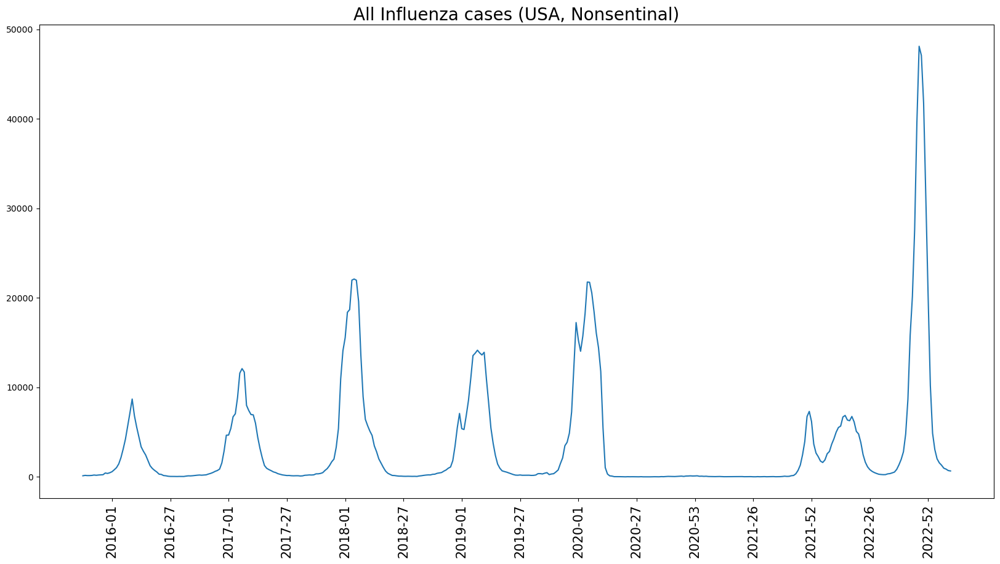

In [34]:
plt.plot(usa_new)
dates = list(usa_new.index)
x_ticks = dates[13:][0::26]
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title("All Influenza cases (USA, Nonsentinal)",size=20)

plt.show()

In [35]:
usa_new.index

Index(['2015-40', '2015-41', '2015-42', '2015-43', '2015-44', '2015-45',
       '2015-46', '2015-47', '2015-48', '2015-49',
       ...
       '2023-01', '2023-02', '2023-03', '2023-04', '2023-05', '2023-06',
       '2023-07', '2023-08', '2023-09', '2023-10'],
      dtype='object', length=388)

In [36]:
fourier = create_all_fourier(52)
dp = DeterministicProcess(index = usa_new.index,
                          constant=True,
                          order=0,
                          seasonal=False,
                          
                          additional_terms=fourier,
                          drop=True,
                         )
X = dp.in_sample()

## USA and AUS

In [37]:
aus_inf_all = flu_net[(flu_net.COUNTRY_CODE =="AUS") ][["MMWRYW","INF_ALL"]]
aus_inf_all = aus_inf_all.set_index("MMWRYW")
aus_inf_all = pd_to_weektime(aus_inf_all)

In [38]:
list(aus_inf_all.index).index(dates[0])

965

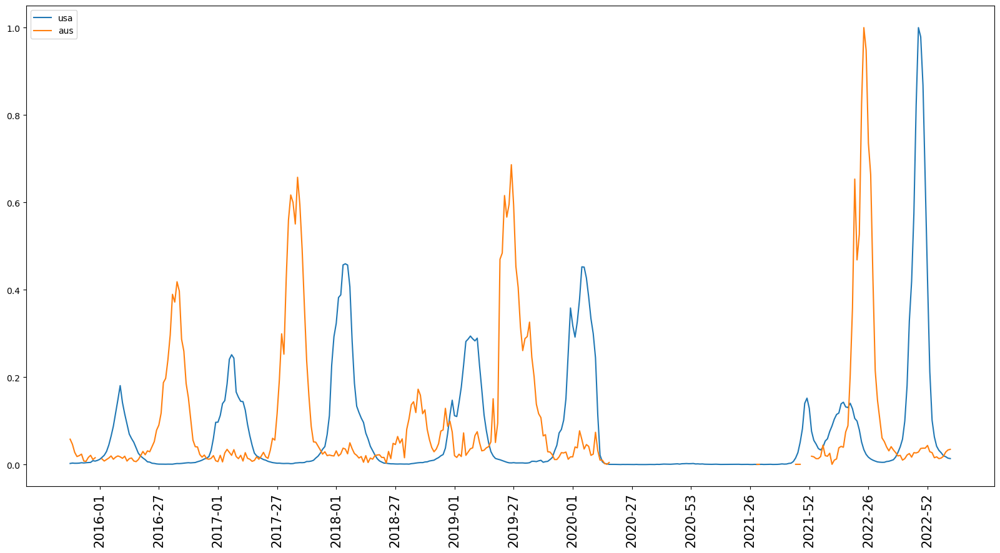

In [40]:
plt.plot(dates,usa_new/max(usa_new.values),label="usa")
plt.plot(dates,aus_inf_all.iloc[965:]/max(aus_inf_all.values),label="aus")
#plt.plot(dates,X_lags["INF_ALLlag_25"]/max(aus_inf_all.values),label="aus_shift")
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.legend(loc="upper left")
plt.show()

In [63]:
X_lags = create_lags(aus_inf_all,"INF_ALL",51-15,15,1)

In [64]:
X_lags = X_lags.iloc[965:-1]
X_lags_more = create_lags(usa_new,"INF_ALL",51-15,15,1)

In [65]:
X_lags_new = X_lags.join(X_lags_more, on=X_lags.index, how='left', lsuffix='aus', rsuffix='usa')
X_lags = X_lags_new.fillna(0.0)


In [66]:
begin_ = 104
range_ = dates.index("2022-26")
X_train, y_train = X[begin_:range_], usa_new[begin_:range_]
Xlags_train = X_lags[begin_:range_]
X_test, y_test = X[range_:-1], usa_new[range_:]
Xlags_test = X_lags[range_:]

In [71]:
X_total = X.join(X_lags,on=X.index,lsuffix="_")
X_total = X_total.fillna(0.0)
X_total_train, X_total_test = X_total[begin_:range_], X_total[range_:]

In [72]:
bh_rf = BoostedHybrid(LinearRegression(),RandomForestRegressor())
bh = BoostedHybrid(LinearRegression(),LinearRegression())
lin_reg = LinearRegression()
rf = RandomForestRegressor()

In [73]:
bh.fit(X_train,Xlags_train,y_train)
bh_rf.fit(X_train,Xlags_train,y_train)
lin_reg.fit(X_total_train,y_train)
rf.fit(X_total_train,y_train)

C:\Users\christopher.johnson\AppData\Local\Temp\ipykernel_12400\2330458734.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf.fit(X_total_train,y_train)


RandomForestRegressor()

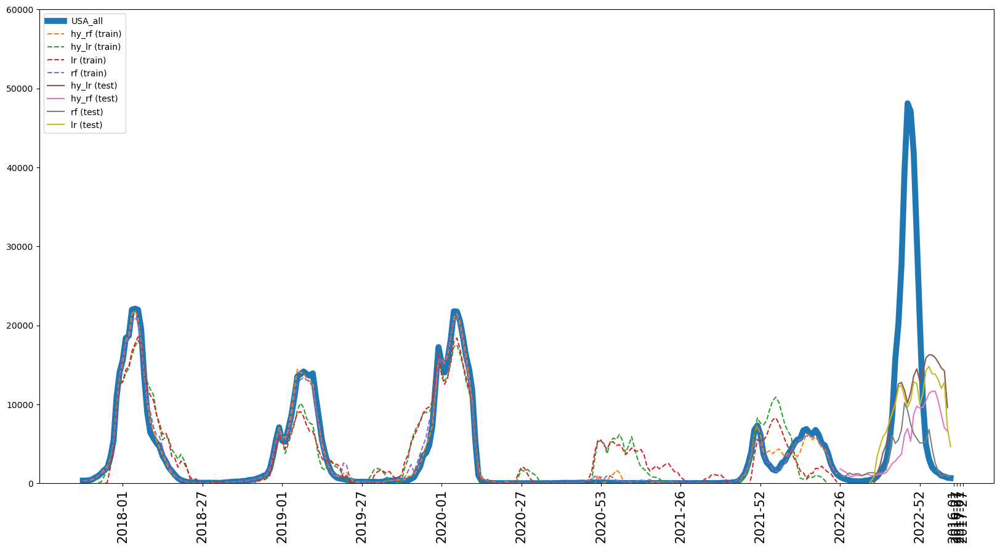

In [76]:
plt.rcParams['figure.figsize'] = (20, 10)
plt.plot(dates[begin_:],usa_new[104:],label="USA_all",linewidth=7)
plt.plot(dates[begin_:range_],bh_rf.predict(X_train,Xlags_train),label = "hy_rf (train)",linestyle="dashed")
plt.plot(dates[begin_:range_],bh.predict(X_train,Xlags_train),label = "hy_lr (train)",linestyle="dashed")
plt.plot(dates[begin_:range_],lin_reg.predict(X_total_train),label = "lr (train)",linestyle="dashed")
plt.plot(dates[begin_:range_],rf.predict(X_total_train),label = "rf (train)",linestyle="dashed")


#plt.plot(dates[range_:],lin_reg.predict(X_test),label="Lin (test)")
plt.plot(dates[range_:-1],bh.predict(X_test,Xlags_test),label="hy_lr (test)")
plt.plot(dates[range_:-1],bh_rf.predict(X_test,Xlags_test),label="hy_rf (test)")
plt.plot(dates[range_:],rf.predict(X_total_test),label="rf (test)")
plt.plot(dates[range_:],lin_reg.predict(X_total_test),label="lr (test)")
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.ylim([0,6e4])
plt.legend(loc="upper left")
plt.show()

## Other regions

In [77]:
europe_inf_all = flu_net[flu_net.WHOREGION=="EUR"][["MMWRYW","COUNTRY_CODE","INF_ALL"]].groupby("MMWRYW").sum()
#europe_inf_all = europe_inf_all.set_index("MMWRYW")
europe_inf_all = pd_to_weektime(europe_inf_all)

In [78]:
africa_inf_all = flu_net[flu_net.WHOREGION=="AFR"][["MMWRYW","COUNTRY_CODE","INF_ALL"]].groupby("MMWRYW").sum()
africa_inf_all = pd_to_weektime(africa_inf_all)

sear_inf_all = flu_net[flu_net.WHOREGION=="SEAR"][["MMWRYW","COUNTRY_CODE","INF_ALL"]].groupby("MMWRYW").sum()
sear_inf_all = pd_to_weektime(sear_inf_all)

wpr_inf_all = flu_net[flu_net.WHOREGION=="WPR"][["MMWRYW","COUNTRY_CODE","INF_ALL"]].groupby("MMWRYW").sum()
wpr_inf_all = pd_to_weektime(wpr_inf_all)

emr_inf_all = flu_net[flu_net.WHOREGION=="EMR"][["MMWRYW","COUNTRY_CODE","INF_ALL"]].groupby("MMWRYW").sum()
emr_inf_all = pd_to_weektime(emr_inf_all)

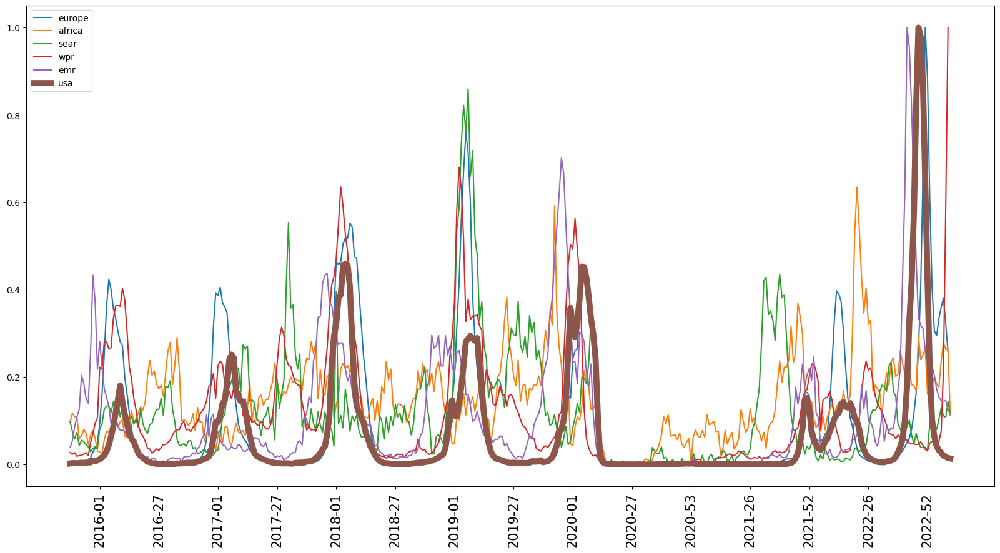

In [79]:
plt.plot(europe_inf_all[list(europe_inf_all.index).index(dates[0]):-1]/europe_inf_all.max(),label="europe")
plt.plot(africa_inf_all[list(africa_inf_all.index).index(dates[0]):-1]/africa_inf_all.max(),label="africa")
plt.plot(sear_inf_all[list(sear_inf_all.index).index(dates[0]):-1]/sear_inf_all.max(),label="sear")
plt.plot(wpr_inf_all[list(wpr_inf_all.index).index(dates[0]):-1]/wpr_inf_all.max(),label="wpr")
plt.plot(emr_inf_all[list(emr_inf_all.index).index(dates[0]):-1]/emr_inf_all.max(),label="emr")



plt.plot(dates,usa_new/usa_new.max(),label="usa",linewidth=7)
#plt.plot(dates,aus_inf_all.iloc[965:-1]/max(aus_inf_all.values),label="aus")
#plt.plot(dates,X_lags["INF_ALLlag_25"]/max(aus_inf_all.values),label="aus_shift")
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.legend(loc="upper left")
plt.show()

In [80]:
flu_net["WHOREGION"].unique()

array(['AMR', 'EUR', 'EMR', 'WPR', 'AFR', 'SEAR'], dtype=object)

## find correlated features

In [81]:
usa_new

,INF_ALL
2015-40,127.0
2015-41,170.0
2015-42,149.0
2015-43,150.0
2015-44,165.0
2015-45,208.0
2015-46,182.0
2015-47,211.0
2015-48,226.0
2015-49,246.0


In [82]:
aus_inf_all

,INF_ALL
1996-52,1.0
1997-01,0.0
1997-02,0.0
1997-03,0.0
1997-04,0.0
1997-05,0.0
1997-06,0.0
1997-07,0.0
1997-08,0.0
1997-09,0.0


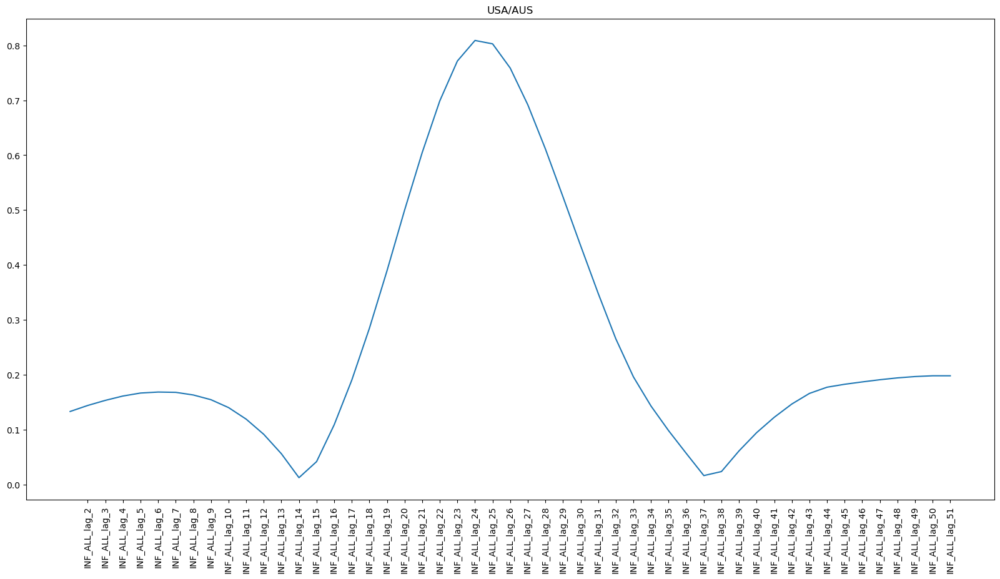

In [83]:
plot_year_lags(usa_new,aus_inf_all,"INF_ALL","USA/AUS")

In [84]:
country_codes = flu_net["COUNTRY_CODE"].unique()

In [85]:
len(country_codes)

181

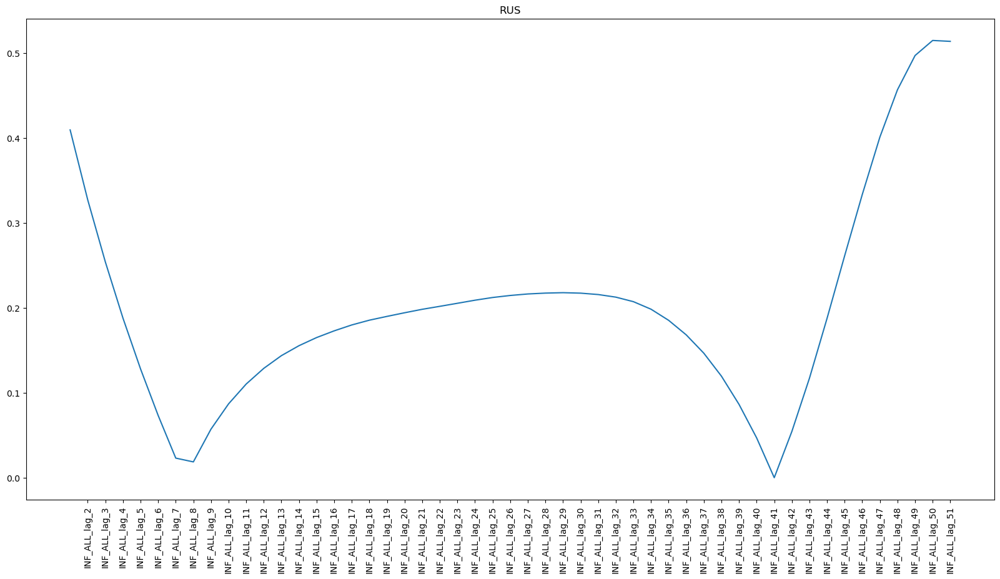

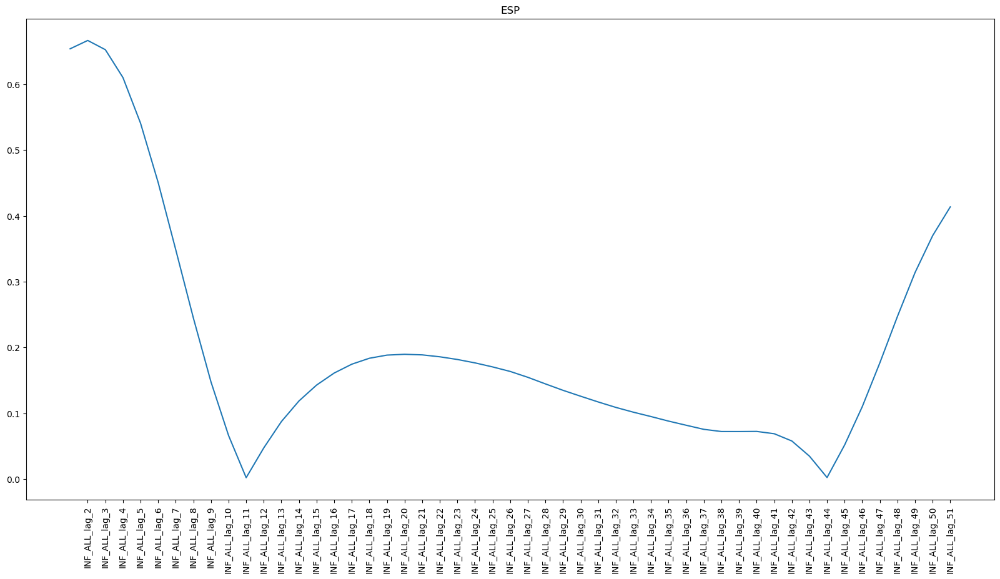

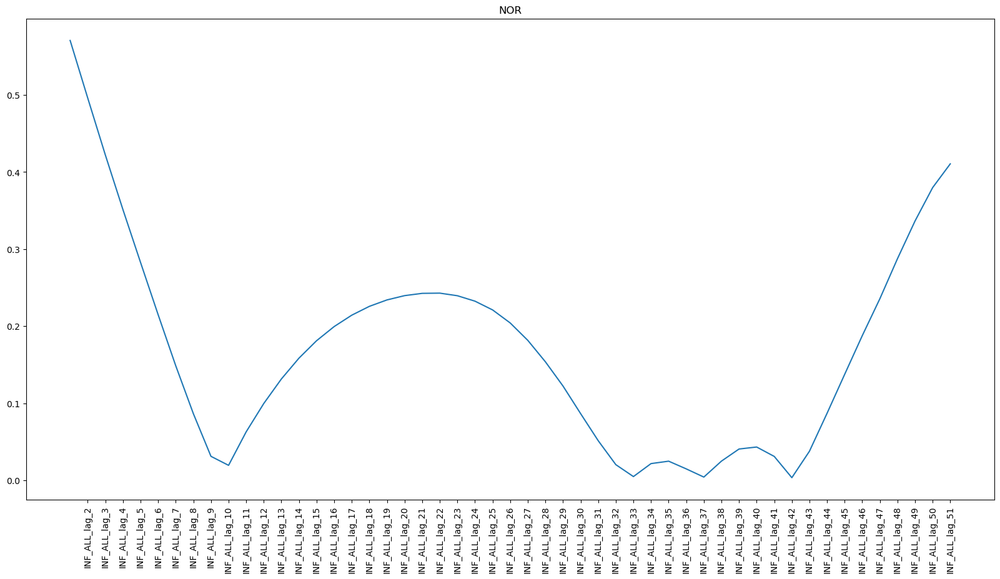

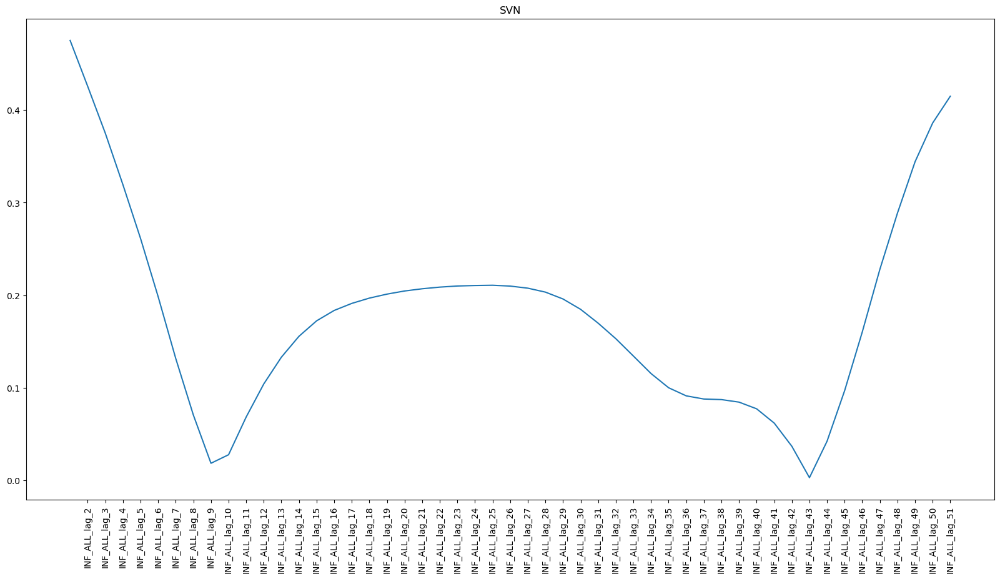

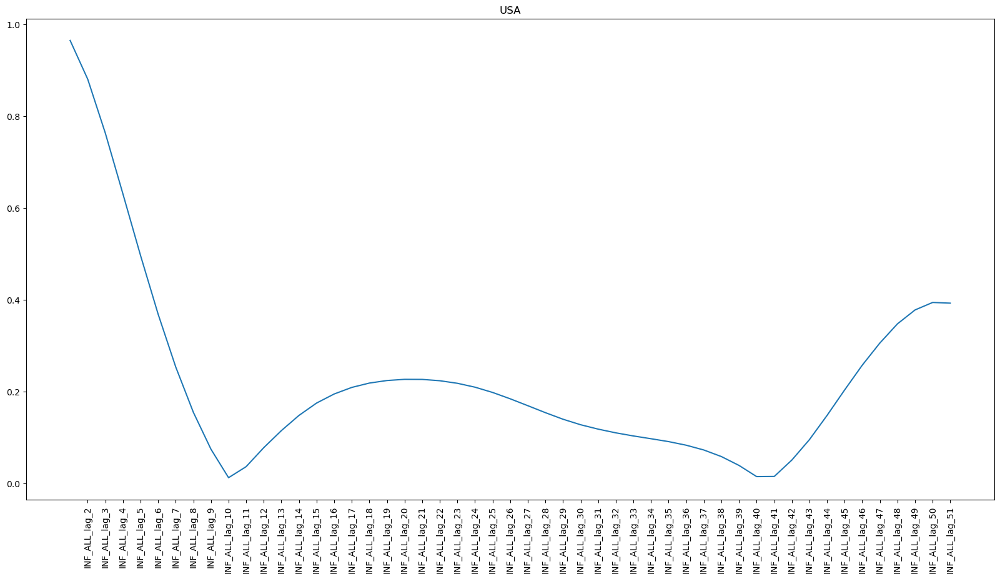

...

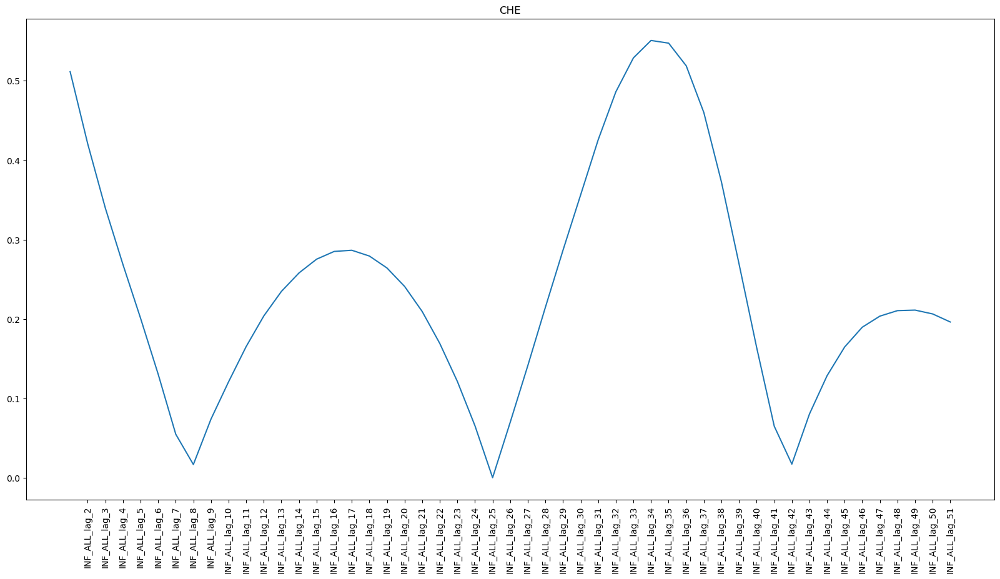

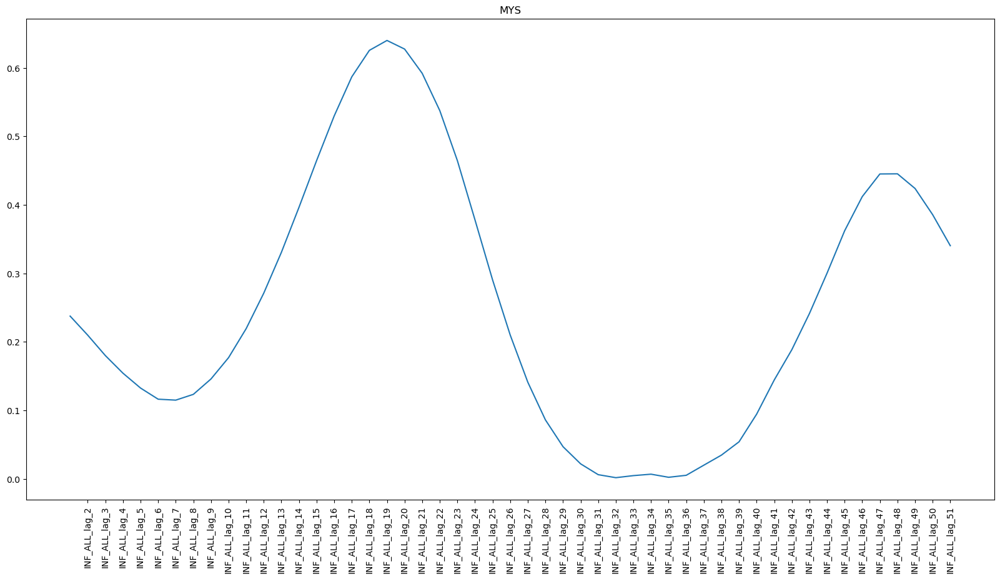

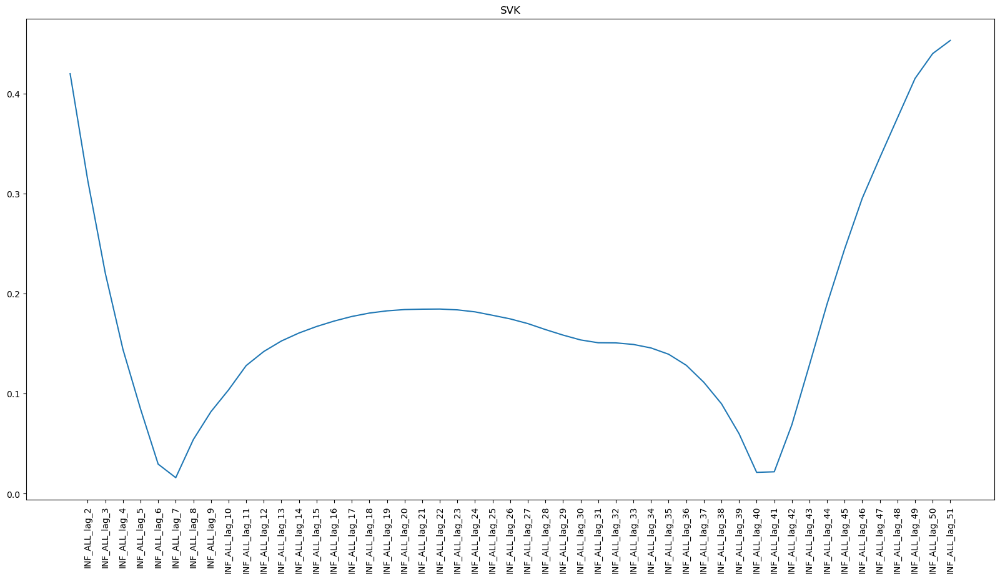

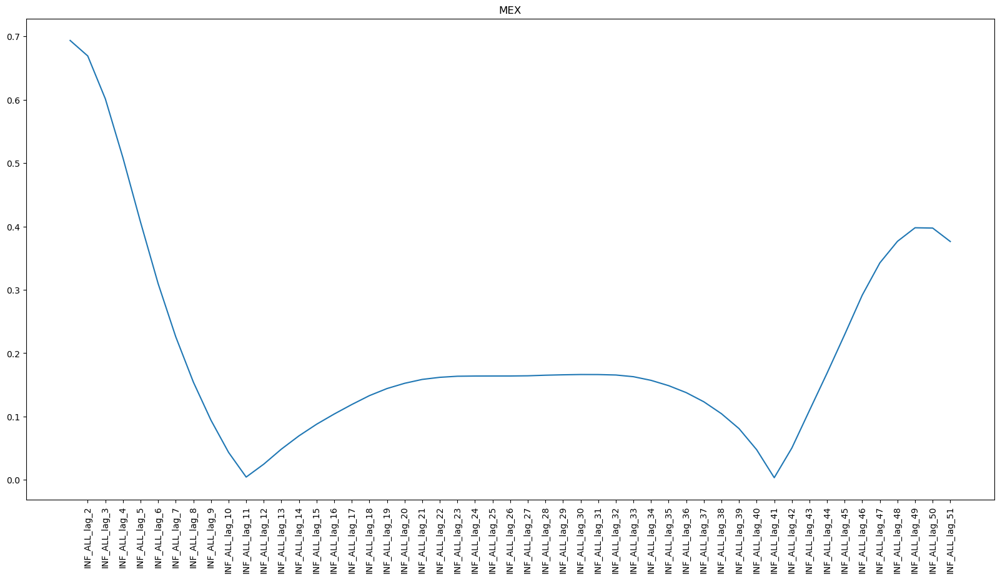

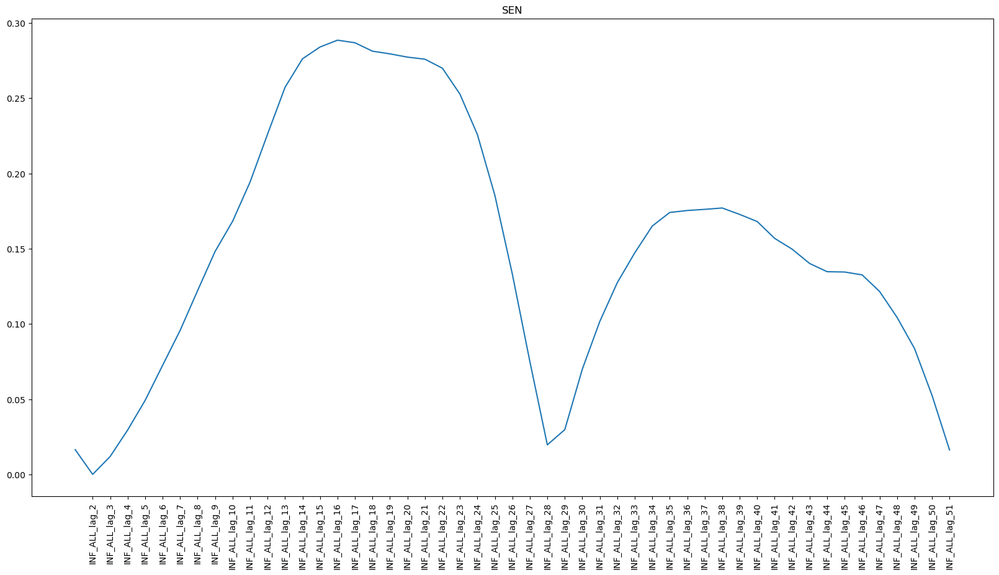

In [86]:
for country in flu_net["COUNTRY_CODE"].value_counts().index[:20]:
    country_inf_all = prep_country(country,"INF_ALL")
    plot_year_lags(usa_new,country_inf_all,"INF_ALL",country)
    

In [87]:
lag_country_list = flu_net["COUNTRY_CODE"].value_counts().index[:20]

In [88]:
lag_country_list = flu_net["COUNTRY_CODE"].value_counts().index
country_keep = []
usa_new_range = usa_new[range_:-1]
for country in lag_country_list:
    country_inf_all = prep_country(country,"INF_ALL")
    if "2022-26" in list(country_inf_all.index):
        ind_start = list(country_inf_all.index).index("2022-26")
        #ind_end = list(country_inf_all.index).index(dates[-1])
        country_inf_all = country_inf_all[ind_start:]


        lags = create_lags(country_inf_all,"INF_ALL",51-15,15,1)

        new_df = usa_new_range.join(lags, on=usa_new_range.index)
        corr = new_df.corr()["INF_ALL"].drop(["INF_ALL"])


        most_corr = abs(corr).max()
        if most_corr > 0.5:
            country_keep.append(country)
            print(country)

RUS
NOR
POL
COL
SWE
CHL
MYS
AUS
JPN
HKG
PER
PRY
CAN
ZAF
MDG
THA
PHL
URY
IND
CRI
KOR
PAN
ECU
BOL
JAM
LKA
CHN
NIC
NPL
KEN
UGA
CIV
TZA
BGD
JOR
VEN
NGA
MLI
MUS
ETH
BHR
CAF
TLS
BLZ
MDV
MRT
SAU
GIN


In [90]:
len(country_keep)

48

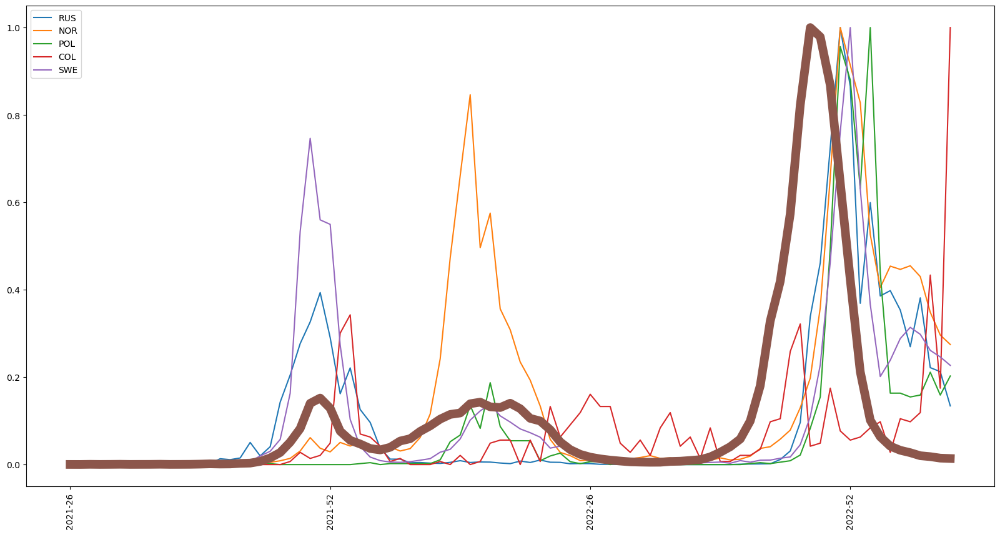

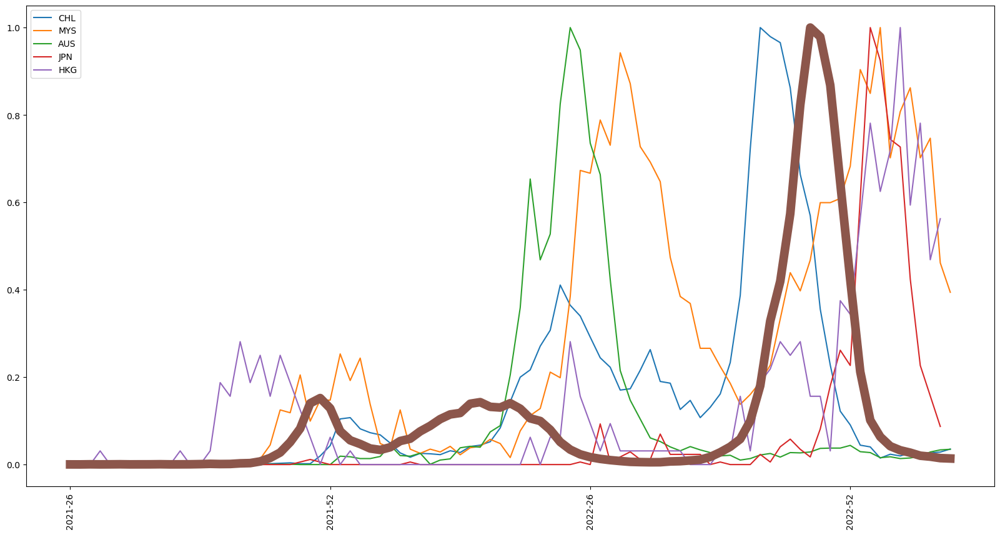

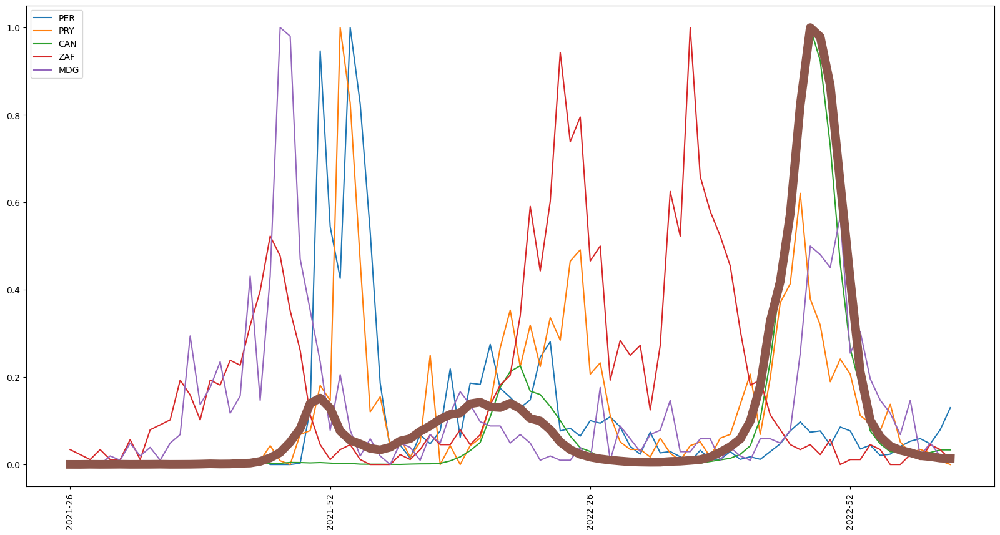

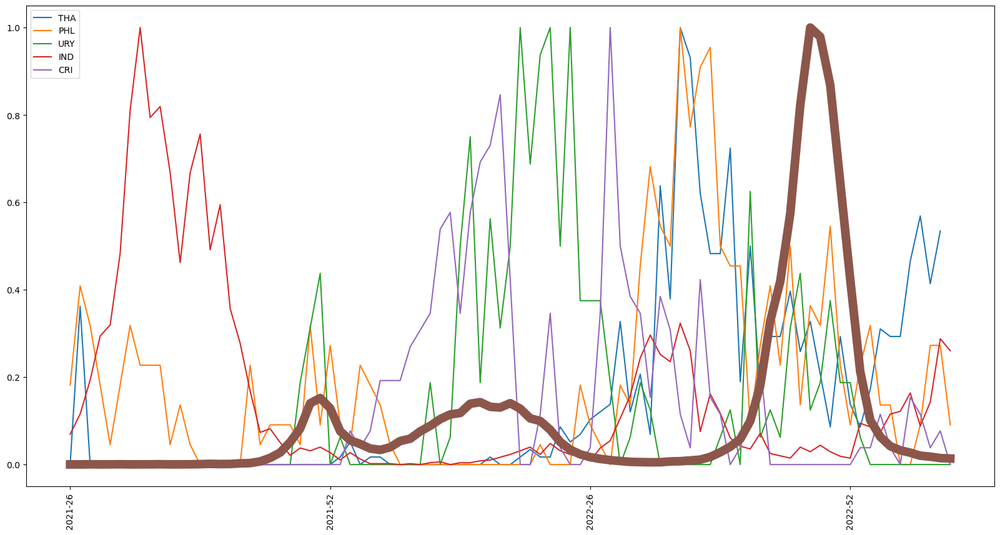

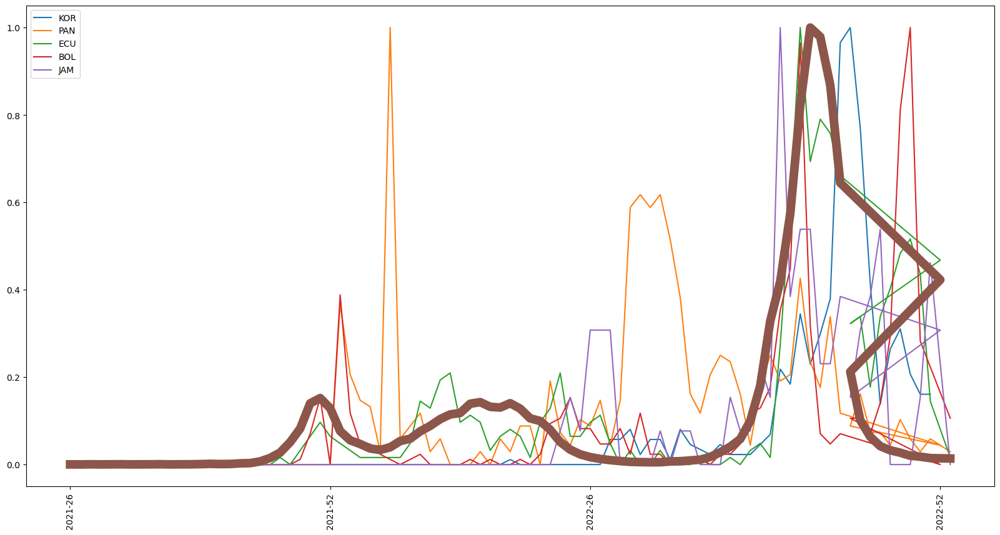

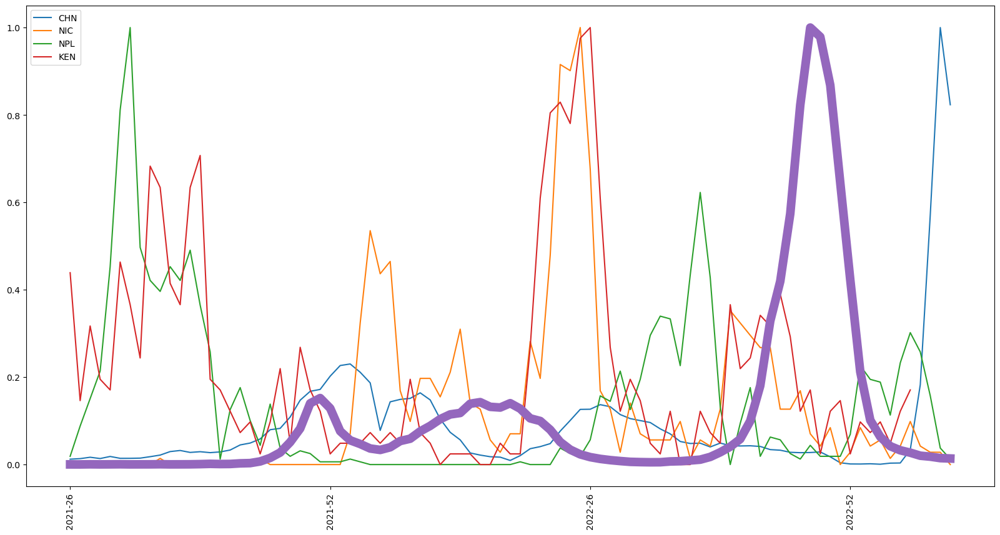

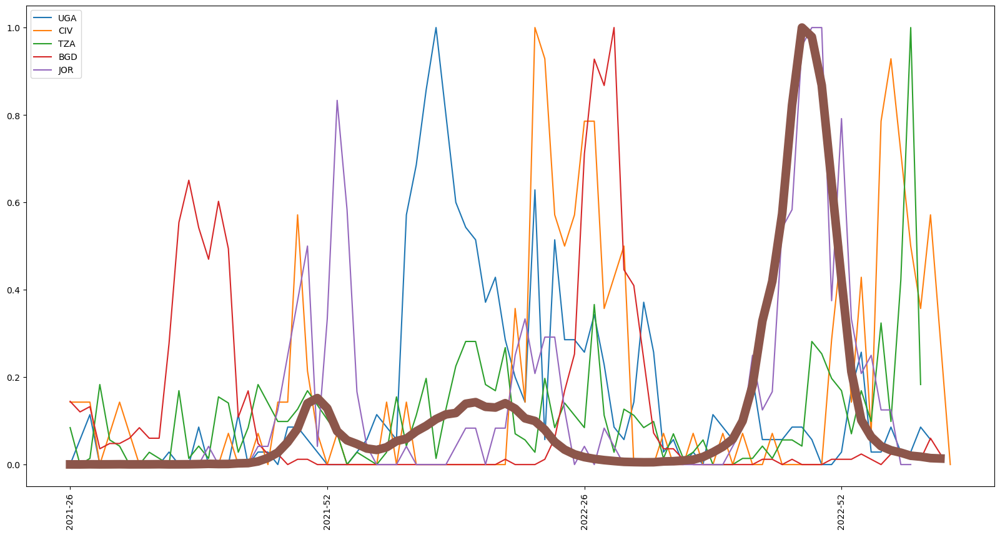

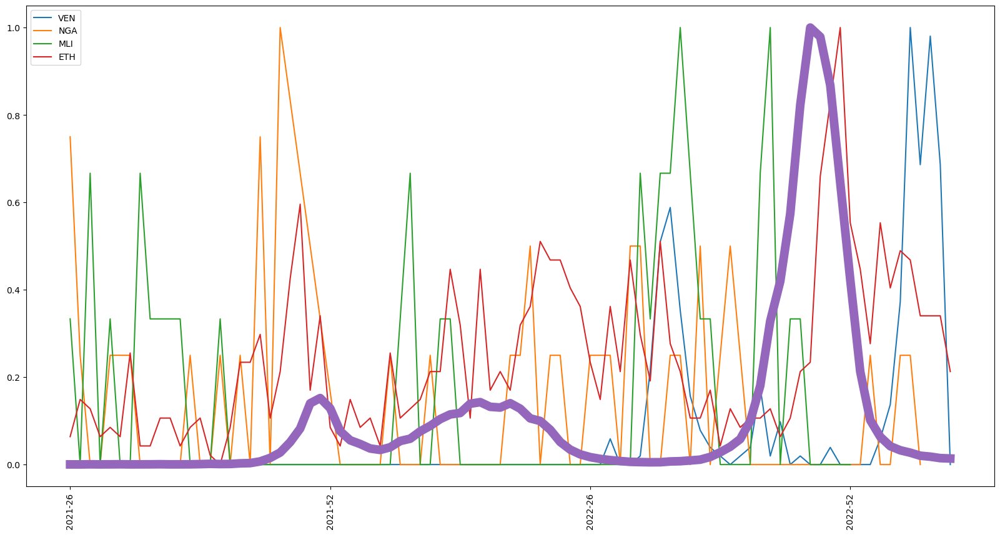

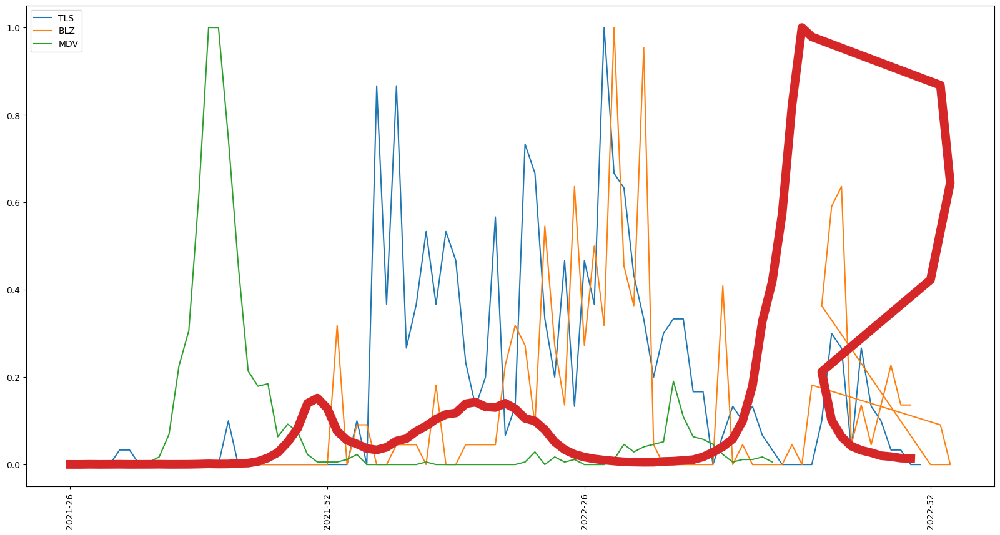

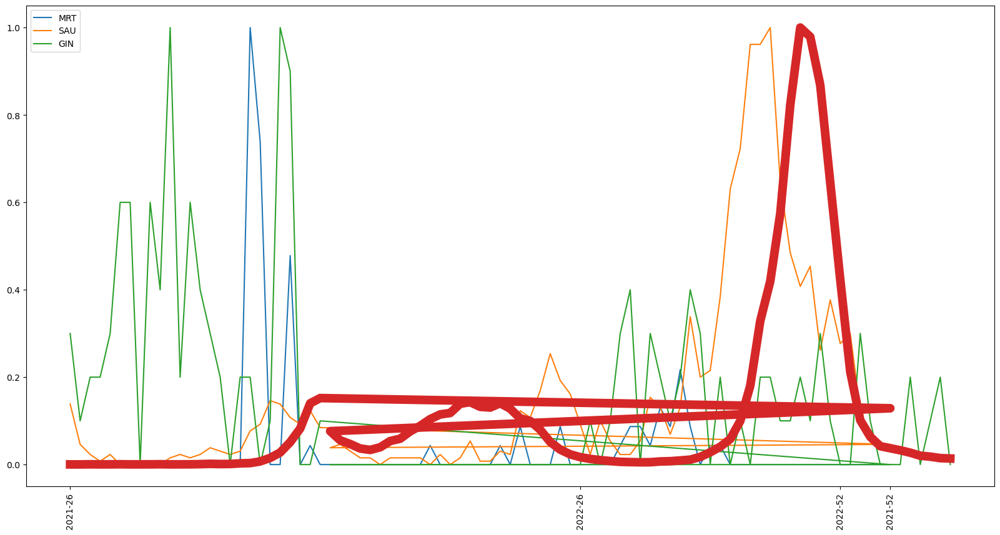

In [91]:


for batch in range(int(np.ceil(len(country_keep)/5))):
    
                   
    for country in country_keep[batch*5:(batch+1)*5]:
        country_inf_all = prep_country(country,"INF_ALL")
        if "2021-26" in list(country_inf_all.index):
            ind_start = list(country_inf_all.index).index("2021-26")
            tmp = country_inf_all[ind_start:]/country_inf_all[ind_start:].max()
            plt.plot(tmp,label = country)
            plt.legend(loc="upper left")
            plt.xticks(ticks=x_ticks[-4:],rotation=90)
    ind_start = list(usa_new.index).index("2021-26")
    tmp = usa_new[ind_start:]/usa_new[ind_start:].max()
    plt.plot(tmp,label = "USA",linewidth=10)
    plt.show()
    

In [92]:
X_lags =create_lags( prep_country("AUS","INF_ALL"),"INF_ALL",51-15,15,1)
ind_start = list(X_lags.index).index(dates[0])
ind_end = list(X_lags.index).index(dates[-1])
X_lags = X_lags[ind_start:ind_end]

In [93]:
for country in country_keep:
    country_inf_all = prep_country(country,"INF_ALL")
    
    
    X_lags_tmp = create_lags(country_inf_all,"INF_ALL",51-15,15,1)
    X_lags = X_lags.join(X_lags_tmp,on=X_lags.index,lsuffix="_"+country,rsuffix="_")

In [94]:
print(len(X_lags.columns))
X_lags = X_lags.fillna(0.)

1764


In [95]:
begin_ = 104
range_ = dates.index("2022-26")
X_train, y_train = X[begin_:range_], usa_new[begin_:range_]
Xlags_train = X_lags[begin_:range_]
X_test, y_test = X[range_:-1], usa_new[range_:]
Xlags_test = X_lags[range_:]

In [96]:
X_total = X.join(X_lags,on=X.index,lsuffix="_")
X_total = X_total.fillna(0.0)
X_total_train, X_total_test = X_total[begin_:range_], X_total[range_:]

In [97]:
bh.fit(X_train,Xlags_train,y_train)
bh_rf.fit(X_train,Xlags_train,y_train)
lin_reg.fit(X_total_train,y_train)
rf.fit(X_total_train,y_train)

C:\Users\christopher.johnson\AppData\Local\Temp\ipykernel_12400\2330458734.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf.fit(X_total_train,y_train)


RandomForestRegressor()

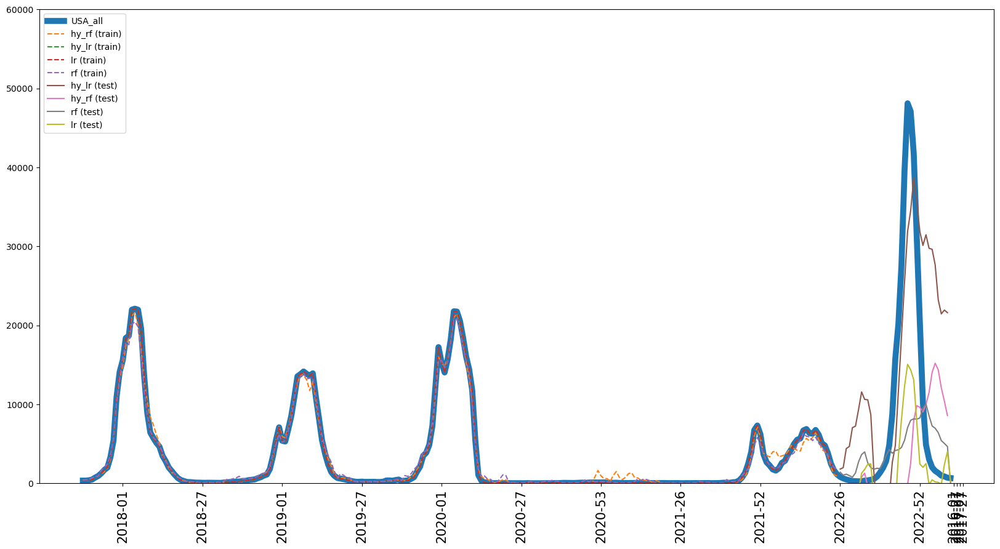

In [98]:
plt.rcParams['figure.figsize'] = (20, 10)
plt.plot(dates[begin_:],usa_new[104:],label="USA_all",linewidth=7)
plt.plot(dates[begin_:range_],bh_rf.predict(X_train,Xlags_train),label = "hy_rf (train)",linestyle="dashed")
plt.plot(dates[begin_:range_],bh.predict(X_train,Xlags_train),label = "hy_lr (train)",linestyle="dashed")
plt.plot(dates[begin_:range_],lin_reg.predict(X_total_train),label = "lr (train)",linestyle="dashed")
plt.plot(dates[begin_:range_],rf.predict(X_total_train),label = "rf (train)",linestyle="dashed")


#plt.plot(dates[range_:],lin_reg.predict(X_test),label="Lin (test)")
plt.plot(dates[range_:-1],bh.predict(X_test,Xlags_test),label="hy_lr (test)")
plt.plot(dates[range_:-1],bh_rf.predict(X_test,Xlags_test),label="hy_rf (test)")
plt.plot(dates[range_:],rf.predict(X_total_test),label="rf (test)")
plt.plot(dates[range_:],lin_reg.predict(X_total_test),label="lr (test)")
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.ylim([0,6e4])
plt.legend(loc="upper left")
plt.show()

In [99]:
## Pytorch
from torch import nn
from torch.utils.data import DataLoader
import torch
from torch.utils.data import Dataset, Subset

In [100]:
df = usa_new
for country in lag_country_list:
    country_inf_all = prep_country(country,"INF_ALL")
    df = df.join(country_inf_all,on=usa_new.index,rsuffix="_"+country,lsuffix="")

In [113]:
df = df.fillna(0.0)
df = df.drop(["INF_ALL"],axis=1)
print(len(df.columns))

181


In [114]:
usa = prep_country("USA","INF_ALL")

In [103]:
class Dataset_(Dataset):
    def __init__(self,dataframe,target):
        step = 1
        length =  52
        shift = length + 15

        df_ss = StandardScaler().fit_transform(df)
        

        X = []
        for i in range(len(dataframe)):
            seq = []
            for j in range(length):
                index_ = j+i - shift
                if index_ >= 0:
                    seq.append(df_ss[index_])
                else:
                    seq.append(np.zeros(shape=(len(dataframe.columns),)))
            X.append(seq)
        X = np.array(X)
        print(X.shape)

        data = []
        y_numpy = target.to_numpy()

        for i in range(X.shape[0]):

            x= torch.from_numpy(X[i])
            y = torch.from_numpy(np.asarray(y_numpy[i]))
            data.append((x,y))


        
        self.data = data

    def __len__(self):
        return len(self.data)
    def __getitem__(self,i):
        return self.data[i]
        

In [105]:
matrix = Dataset_(df,usa_new_range)

(388, 52, 182)


c:\Users\christopher.johnson\Anaconda3\lib\site-packages\sklearn\utils\extmath.py:985: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
c:\Users\christopher.johnson\Anaconda3\lib\site-packages\sklearn\utils\extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
c:\Users\christopher.johnson\Anaconda3\lib\site-packages\sklearn\utils\extmath.py:1020: RuntimeWarning: invalid value encountered in true_divide
  new_unnormalized_variance -= correction ** 2 / new_sample_count


IndexError: index 36 is out of bounds for axis 0 with size 36

In [106]:
class CNN(nn.Module):

    def __init__(self,seq_len,feature_len):

        super(CNN, self).__init__()


        self.model_seq = nn.Sequential(

            nn.ReLU(),
            nn.Conv1d(seq_len,1,kernel_size=6),
            #nn.MaxPool1d(kernel_size=3),
            nn.Flatten(),
            nn.Dropout(0.25),
            nn.ReLU(),
            nn.Linear(176,1)


        )
        self.linear = nn.Sequential(
            nn.ReLU(),
            nn.Linear(feature_len,feature_len)
        )

    def forward(self, x):

        x = self.linear(x)

        logits = self.model_seq(x)

        return logits

In [107]:
def train(dataloader, model,device, loss_fn, optimizer):
    
    # train function gets called inside function train_model
    # set up to be general but loss_fn and optimizer are hardcoded in train_model

    model.train()
    cnt = 0
    total_loss = 0
    for batches in dataloader:
            x,y = batches
         
            x=x.to_dense().to(device)
            y= y.to(device)
            pred=  model(x.float())
          
            loss = loss_fn(pred,y.float())
           
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            
            loss,current = loss.item(), cnt * len(x) # can't remember why I wanted "current"
          
            cnt+=1
            total_loss+= loss
    return float(total_loss)

In [108]:
def test(dataloader, model, device,loss_fn):
    
    #same thing as train but doesn't run the optimizer

    num_batches = len(dataloader)
    
    model.eval()
    test_loss, correct = 0,0
    with torch.no_grad():
        for X, y in dataloader:
            X,y = X.to_dense().to(device), y.to(device)
            pred = model(X.float())
            
            test_loss+=loss_fn(pred,y.float()).item()
           
    return test_loss

In [109]:
def train_model(PATH,model,device,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,forecast):

# This is the function for minimizing a model for a dataset, saves best val and train model in PATH and outputs two tuples of losses for train/val


# PATH = destination for saving/loading the model
# model, device = model class instance , resources
# batched_sequence = Dataset instance
# learn_rate = (float) learn_rate 
# num_epochs = (int) number of epochs
# kill = (int) if loss does not decrease for "kill" number of epochs end the routine
# batch_size_ = (int) batch size
# t_beg = (int) index in DATES to start fit
# t_end = (int) index in DATES to end fit
# forecast = (int) number of indices to include in validation beyond t_end

    #sparse_tensor = Dataset_(Y_df,dataframe_list) 
    #batched_sequence = SequenceDataset(sparse_tensor) # this is hard coded in but could get rid of this by just feeding batched_sequence as input
    loss_values = []
    pred = []
    train_ = Subset(batched_sequence,range(t_beg,t_end)) 
    train_dataloader = DataLoader(train_, batch_size=batch_size_, shuffle=False)

    test_ = Subset(batched_sequence,range(t_end,t_end+forecast))
    test_dataloader = DataLoader(test_, batch_size=1, shuffle=False)




    loss_fn = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learn_rate)
    losses, losses_test = [],[]
    c, epoch, loss_cut= 0,0, 1e12 # init
    d=c
    loss_cut_t = loss_cut

    while epoch < num_epochs:
    #for epoch in range(num_epochs):
        print("epoch",epoch,c,d)
        c+=1
        d+=1
        if d % 25 == 0 and d!=0:
            learn_rate*=0.1
            d=0
            
            print("Shrinkinkg learning rate to",str(learn_rate))
            if learn_rate < 1e-5:
                print("Learning rate getting small")
                learn_rate = 1e-2
   #         optimizer = torch.optim.Adam(model.parameters(), lr=learn_rate)
        loss = train(train_dataloader,model,device,loss_fn,optimizer)
        losses.append(loss)
    
        loss_test = test(test_dataloader,model,device,loss_fn)
        losses_test.append(loss_test)
    
        print("Train loss:",loss,"Val loss:",loss_test)
    
        if loss_test < loss_cut:
            loss_cut = loss_test
            torch.save(model.state_dict(), PATH)
            c = 0
        if loss < loss_cut_t:
            loss_cut_t = loss
            torch.save(model.state_dict(), PATH[:-4]+"_train.pth")
            d = 0
       # test(train_dataloader,model,loss_fn)
    
        if d == kill and epoch > 25:
            break
        epoch +=1
            
    
    print("Complete")
    return losses,losses_test

In [110]:
def plot_history(loss_t,loss_v):

    # simple training history plotter

    # loss_t = tuple of training loss
    # loss_v = tuple of validation loss
    
    plt.plot(loss_t,label="train loss")
    plt.plot(loss_v,label="pred loss")
    #plt.ylim([0,0.02])
    plt.legend(loc="upper right")

In [111]:
def create_prediction(PATH,NN,batched_sequence):
    
    # PATH = location of model
    # NN = model class instance
    # batched_sequence= data class instance
    # Y_mean = mean of target for undoing standard scalar transform
    # Y_std = standard deviation of target for undoing standard scalar transform
    # norm_bool = True/False if you want to return Normalized/Raw transformation
    
    NN.load_state_dict(torch.load(PATH))
    NN.eval()
    #sparse_tensor = Dataset_(Y_df,dataframe_list)
    #batched_sequence = SequenceDataset(sparse_tensor)
    
    datas = DataLoader(batched_sequence, batch_size=1, shuffle=False)
    all_,ys = [],[]
    for x,y in datas:
        x=x.to_dense().to(device)
        
        pred= NN(x.float())
        #print(x,pred[:,0,0].detach().numpy())
        all_.append(pred[:,0].detach().numpy())
        ys.append(y.to_dense().numpy())
    all_ =  np.array(all_)
    
    return all_

In [120]:
device = torch.device("cpu")
model = CNN(52,181).to(device)
PATH = model.__class__.__name__+".train"
batched_sequence = Dataset_(df,usa[-388:])
learn_rate = 1e-3
num_epochs = 150
kill = num_epochs
batch_size_ = 3
t_beg = 0
t_end = list(df.index).index("2022-26")
forecast = len(df.index) - t_end

loss_t,loss_v = train_model(PATH,model,device,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,forecast)


(388, 52, 181)
epoch 0 0 0
Train loss: 5453108518.059448 Val loss: 12220463381.923496
epoch 1 0 0
Train loss: 4666487445.902344 Val loss: 11039171253.198364
epoch 2 0 0
Train loss: 4091993154.5009766 Val loss: 10677401738.492188
epoch 3 0 0
Train loss: 3763450633.455078 Val loss: 10460529502.6875
epoch 4 0 0
Train loss: 3369238490.3774414 Val loss: 10297040881.601929
epoch 5 0 0
Train loss: 2821596017.5255737 Val loss: 10172459599.46582
epoch 6 0 0
Train loss: 2277273099.406616 Val loss: 10107191968.340332
epoch 7 0 0
Train loss: 1840946089.093689 Val loss: 10059195430.701172
epoch 8 0 0
Train loss: 1575561003.958374 Val loss: 10018725891.901367
epoch 9 0 0
Train loss: 1413709816.1296387 Val loss: 10010036254.545898
epoch 10 0 0
Train loss: 1273548279.287506 Val loss: 9959143464.814453
epoch 11 0 0
Train loss: 1173224573.790985 Val loss: 9929052274.312012
epoch 12 0 0
Train loss: 1037820878.1298141 Val loss: 9850956090.360575
epoch 13 0 0
Train loss: 959615446.3588257 Val loss: 9806022

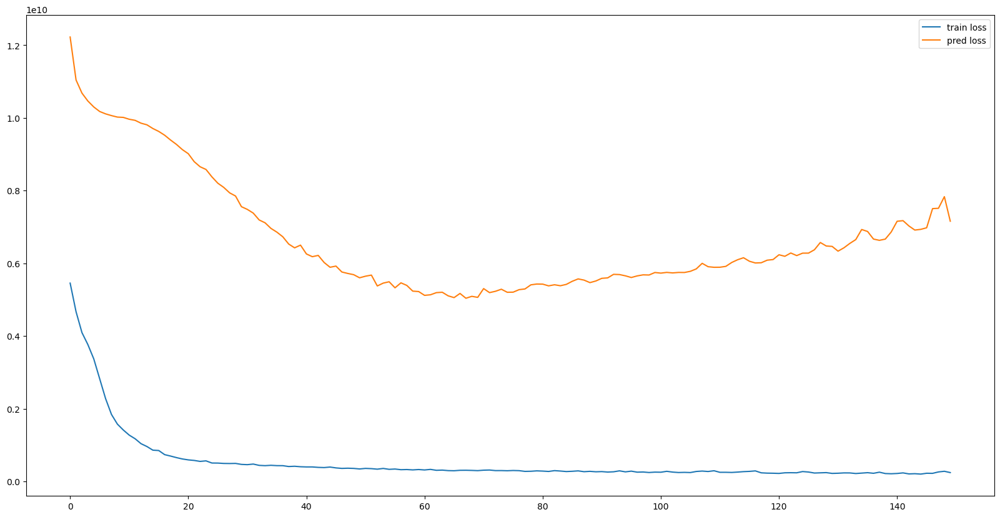

In [121]:
plot_history(loss_t,loss_v)

In [116]:
df

,INF_ALL_RUS,INF_ALL_ESP,INF_ALL_NOR,INF_ALL_SVN,INF_ALL_USA,INF_ALL_DEU,INF_ALL_DNK,INF_ALL_POL,INF_ALL_COL,INF_ALL_FIN,INF_ALL_PRT,INF_ALL_SWE,INF_ALL_CHL,INF_ALL_ROU,INF_ALL_ISL,INF_ALL_CHE,INF_ALL_MYS,INF_ALL_SVK,INF_ALL_MEX,INF_ALL_SEN,INF_ALL_BRA,INF_ALL_AUS,INF_ALL_NLD,INF_ALL_JPN,INF_ALL_ARG,INF_ALL_IRL,INF_ALL_BEL,INF_ALL_X09,INF_ALL_LVA,INF_ALL_BGR,INF_ALL_HKG,INF_ALL_UKR,INF_ALL_PER,INF_ALL_X11,INF_ALL_PRY,INF_ALL_GRC,INF_ALL_GEO,INF_ALL_EST,INF_ALL_X12,INF_ALL_CAN,INF_ALL_ZAF,INF_ALL_KAZ,INF_ALL_MDA,INF_ALL_MDG,INF_ALL_LTU,INF_ALL_KGZ,INF_ALL_THA,INF_ALL_BLR,INF_ALL_PHL,INF_ALL_AZE,INF_ALL_NCL,INF_ALL_URY,INF_ALL_IND,INF_ALL_EGY,INF_ALL_HRV,INF_ALL_X10,INF_ALL_ITA,INF_ALL_HND,INF_ALL_CZE,INF_ALL_TUR,INF_ALL_SRB,INF_ALL_ARM,INF_ALL_ISR,INF_ALL_LUX,INF_ALL_GUF,INF_ALL_CRI,INF_ALL_AUT,INF_ALL_MNG,INF_ALL_DOM,INF_ALL_SLV,INF_ALL_KOR,INF_ALL_CUB,INF_ALL_IRN,INF_ALL_PAN,INF_ALL_ECU,INF_ALL_VNM,INF_ALL_BOL,INF_ALL_JAM,INF_ALL_SGP,INF_ALL_GTM,INF_ALL_KHM,INF_ALL_LKA,INF_ALL_CHN,INF_ALL_HUN,INF_ALL_LAO,INF_ALL_NIC,INF_ALL_CMR,INF_ALL_NPL,INF_ALL_GHA,INF_ALL_KEN,INF_ALL_MAR,INF_ALL_UGA,INF_ALL_NER,INF_ALL_IRQ,INF_ALL_UZB,INF_ALL_OMN,INF_ALL_TUN,INF_ALL_PAK,INF_ALL_IDN,INF_ALL_ZMB,INF_ALL_FRA,INF_ALL_CIV,INF_ALL_ALB,INF_ALL_TZA,INF_ALL_BGD,INF_ALL_MLT,INF_ALL_COD,INF_ALL_JOR,INF_ALL_VEN,INF_ALL_GLP,INF_ALL_QAT,INF_ALL_BTN,INF_ALL_NGA,INF_ALL_TGO,INF_ALL_AFG,INF_ALL_MTQ,INF_ALL_DZA,INF_ALL_FJI,INF_ALL_NZL,INF_ALL_MLI,INF_ALL_BFA,INF_ALL_MUS,INF_ALL_ETH,INF_ALL_SUR,INF_ALL_MMR,INF_ALL_MOZ,INF_ALL_BIH,INF_ALL_BHR,INF_ALL_XKX,INF_ALL_MNE,INF_ALL_CAF,INF_ALL_SLE,INF_ALL_TJK,INF_ALL_RWA,INF_ALL_MKD,INF_ALL_LBN,INF_ALL_HTI,INF_ALL_TLS,INF_ALL_BLZ,INF_ALL_BRB,INF_ALL_MDV,INF_ALL_DMA,INF_ALL_TTO,INF_ALL_MRT,INF_ALL_SAU,INF_ALL_ABW,INF_ALL_LCA,INF_ALL_GIN,INF_ALL_PNG,INF_ALL_TCD,INF_ALL_TKM,INF_ALL_VCT,INF_ALL_SCG,INF_ALL_KNA,INF_ALL_BMU,INF_ALL_PSE,INF_ALL_CYP,INF_ALL_TCA,INF_ALL_AIA,INF_ALL_CYM,INF_ALL_BHS,INF_ALL_ATG,INF_ALL_SYR,INF_ALL_ARE,INF_ALL_BLM,INF_ALL_MAF,INF_ALL_AGO,INF_ALL_VGB,INF_ALL_GRD,INF_ALL_KWT,INF_ALL_SSD,INF_ALL_SYC,INF_ALL_PRK,INF_ALL_YEM,INF_ALL_COG,INF_ALL_GAB,INF_ALL_SDN,INF_ALL_NAM,INF_ALL_ZWE,INF_ALL_GUY,INF_ALL_MSR
2015-40,2.0,0.0,3.0,1.0,209.0,2.0,2.0,0.0,12.0,0.0,0.0,8.0,91.0,0.0,0.0,4.0,1.0,0.0,13.0,20.0,9.0,85.0,4.0,13.0,47.0,1.0,0.0,31.0,0.0,0.0,27.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,8.0,53.0,5.0,0.0,0.0,10.0,0.0,0.0,9.0,0.0,1.0,0.0,9.0,1.0,76.0,23.0,0.0,1.0,0.0,0.0,0.0,5.0,0.0,0.0,2.0,0.0,0.0,4.0,0.0,0.0,4.0,1.0,0.0,16.0,34.0,8.0,0.0,10.0,7.0,0.0,6.0,0.0,1.0,7.0,202.0,0.0,14.0,0.0,11.0,2.0,3.0,0.0,1.0,2.0,0.0,0.0,0.0,22.0,0.0,0.0,17.0,2.0,21.0,6.0,0.0,6.0,9.0,0.0,1.0,2.0,0.0,0.0,35.0,8.0,0.0,3.0,0.0,1.0,0.0,23.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-41,3.0,0.0,3.0,0.0,228.0,1.0,2.0,1.0,16.0,0.0,1.0,6.0,84.0,1.0,0.0,3.0,1.0,0.0,7.0,38.0,12.0,68.0,2.0,8.0,25.0,0.0,1.0,18.0,0.0,0.0,25.0,0.0,0.0,2.0,0.0,1.0,0.0,1.0,5.0,37.0,6.0,0.0,0.0,5.0,0.0,0.0,11.0,0.0,1.0,0.0,2.0,2.0,41.0,4.0,0.0,0.0,0.0,3.0,0.0,7.0,0.0,0.0,1.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,1.0,8.0,13.0,9.0,0.0,18.0,7.0,0.0,3.0,0.0,2.0,15.0,194.0,0.0,11.0,0.0,5.0,1.0,3.0,0.0,0.0,5.0,0.0,0.0,0.0,19.0,0.0,0.0,13.0,7.0,8.0,8.0,0.0,0.0,11.0,0.0,1.0,0.0,0.0,0.0,85.0,1.0,0.0,5.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,58.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,4.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-42,1.0,0.0,5.0,0.0,223.0,0.0,2.0,0.0,13.0,0.0,0.0,9.0,79.0,1.0,0.0,0.0,3.0,0.0,13.0,20.0,11.0,41.0,0.0,33.0,19.0,1.0,1.0,16.0,1.0,0.0,23.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,5.0,26.0,6.0,0.0,0.0,4.0,0.0,0.0,3.0,0.0,0.0,0.0,2.0,1.0,26.0,2.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,1.0,1.0,0.0,12.0,

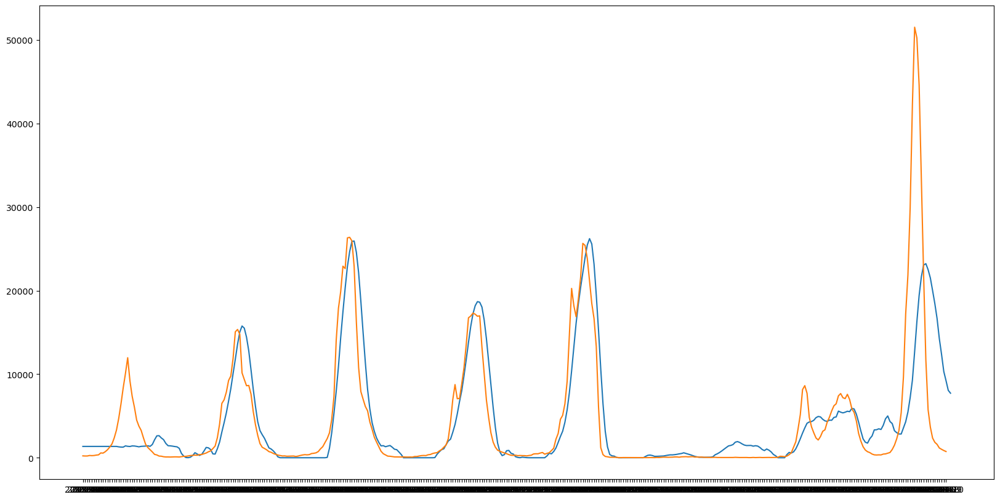

In [122]:
pred  = create_prediction(PATH,model,batched_sequence)
plt.plot(pred)
plt.plot(usa[-386:])

In [267]:
from sklearn.preprocessing import StandardScaler
df_ss = StandardScaler().fit_transform(df)

In [269]:
df_ss.shape

(386, 181)